In [1]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import statsmodels.api as sm
import GraphHelpers as GH

In [2]:
#Read in data
RawData=pd.read_csv('.\RawDatafiles\RainShelterBeta_Energy.dat.gz', #specify file path for data to read in
                         compression = 'gzip',  #file is ziped
                         parse_dates=True, #tell the function to parse date columns to datetime formats
                         dayfirst=True, #tell the function that the day is before the year in the data i.e format='%d/%m/%Y %H:%M'
                         skiprows = [0,2,3], #leave out rows 1, 3 and 4 which have redundant information
                         index_col = 0, #Use the first column, which is Date, as an index
                         na_values = 'NAN')

## Check index for duplicates

In [3]:
seen = {}
dupes = []

for x in RawData.index:
    if x not in seen:
        seen[x] = 1
    else:
        if seen[x] == 1:
            dupes.append(x)
        seen[x] += 1
dupes

[]

## No duplicates = good

In [5]:
#Bring in index data
DataIndex=pd.read_excel('.\IndexFiles\RadiationAndTempIndex.xlsx', 
                        sheet_name='Sensor positions',
                        usecols = range(9))
DataIndex.set_index('ColumnHeader',inplace=True)
# #Apply indexes to data
DataTransposed = RawData.transpose() 
DataIndexed = pd.concat([DataIndex,DataTransposed], axis=1,sort=False)
DataIndexed.index.name='ColumnHeader'
DataIndexed.set_index(['Measurement','Irrigation','Nitrogen','Treatment','Units','Summary','Plot','Block'], 
                         append=False, inplace=True)
Data=DataIndexed.transpose()
Data.index = pd.to_datetime(Data.index)  ## for some reason the concat function changes the data type on the date indes so need to change it back
Data = Data.drop(columns='Time',level=0) ## Drop blank time column
Data.sort_index(inplace=True)
Data.sort_index(axis=1,inplace=True)

## Set up Graphics Patterns

In [6]:
GPs = GH.SetGraphicsPatterns(Data.IR_SurfaceTemp.columns,
                    ['-','--'],
                    [0.15,0.45],
                    ['o','^'],
                    ['orange','green','purple'])

Start = Data.index.min()
End = Data.index.max()

Irrigation
['Excess', 'Normal']
Nitrogen
['125', '320', '80']
Treatments
MultiIndex(levels=[['Excess', 'Normal'], ['125', '320', '80']],
           labels=[[0, 0, 0, 1, 1, 1], [0, 1, 2, 0, 1, 2]])
Styles
[('-', 'orange', 0.15, 'o'), ('-', 'green', 0.15, 'o'), ('-', 'purple', 0.15, 'o'), ('--', 'orange', 0.45, '^'), ('--', 'green', 0.45, '^'), ('--', 'purple', 0.45, '^')]
StyleFrame
           Lin     Col   Alp Mar     MFC
Excess 125   -  orange  0.15   o  orange
       320   -   green  0.15   o   green
       80    -  purple  0.15   o  purple
Normal 125  --  orange  0.45   ^   white
       320  --   green  0.45   ^   white
       80   --  purple  0.45   ^   white


### Work out how long our date series in in weeks

In [7]:
from datetime import timedelta #Import function needed for doing date deltas 
FirstMeasurement  = Data.index.min(axis=0)
LastMeasurement = Data.index.max(axis=0)
Duration = (LastMeasurement - FirstMeasurement)/timedelta(weeks=1)
ExptDuration = np.round(Duration,decimals=0) #weeks
ExptDuration

22.0

### Graph data in two weekly blocks to see how it looks

In [19]:
Data.IR_SurfaceTemp.dropna(axis=1)

Irrigation           Excess                                  Normal          \
Nitrogen                125     320              80             125           
Treatment                 3       2       4       3       4       1       2   
Units                 Deg C   Deg C   Deg C   Deg C   Deg C   Deg C   Deg C   
Summary                 Avg     Avg     Avg     Avg     Avg     Avg     Avg   
Plot                    118     115     107     112     114     116     111   
Block                     3       3       2       2       3       3       2   
2017-08-21 03:20:00  12.780  12.640  12.900  13.070  13.030  12.830  13.030   
2017-09-06 16:00:00  12.380  12.270  12.570  12.670  12.630  12.400  12.630   
2017-09-06 16:10:00  12.150  11.860  12.180  12.270  12.170  12.020  12.150   
2017-09-06 16:20:00  11.930  11.580  11.910  12.000  11.870  11.750  11.810   
2017-09-06 16:30:00  11.420  11.260  11.570  11.540  11.450  11.350  11.470   
2017-09-06 16:40:00  11.480  11.170  11.490  11.530  11.480  11.250  11.370   
2017-09-06 16:50:00  11.200  10.940  11.270  11.250  11.210  11.000  11.150   
2017-09-06 17:00:00  10.660  10.480  10.710  10.530  10.620  10.590  10.690   
2017-09-06 17:10:00   9.940  10.070  10.020   9.910  10.070  10.120  10.070   
2017-09-06 17:20:00   9.440   9.560   9.440   9.370   9.610   9.500   9.410   
2017-09-06 17:30:00   9.020   9.080   9.010   8.880   9.060   8.990   8.940   
2017-09-06 17:40:00   8.420   8.450   8.450   8.360   8.410   8.430   8.400   
2017-09-06 17:50:00   8.310   8.360   8.310   8.240   8.310   8.250   8.290   
2017-09-06 18:00:00   8.040   8.050   8.030   7.968   8.000   7.988   8.010   
2017-09-06 18:10:00   7.883   7.887   7.819   7.734   7.824   7.805   7.760   
2017-09-06 18:20:00   7.498   7.575   7.542   7.480   7.488   7.453   7.471   
2017-09-06 18:30:00   7.289   7.253   7.238   7.147   7.168   7.158   7.183   
2017-09-06 18:40:00   6.983   7.099   6.970   6.914   7.001   6.970   6.961   
2017-09-06 18:50:00   7.101   7.087   7.102   7.020   7.029   6.921   6.984   
2017-09-06 19:00:00   6.800   6.910   6.838   6.770   6.842   6.781   6.829   
2017-09-06 19:10:00   6.111   6.217   6.101   6.071   6.118   6.219   6.174   
2017-09-06 19:20:00   5.840   6.034   5.974   6.017   5.911   5.998   6.029   
2017-09-06 19:30:00   5.930   6.041   6.025   5.954   5.938   5.978   5.991   
2017-09-06 19:40:00   5.814   5.861   5.904   5.824   5.774   5.735   5.835   
2017-09-06 19:50:00   5.472   5.483   5.585   5.529   5.456   5.459   5.515   
2017-09-06 20:00:00   4.924   5.065   4.990   4.971   4.958   5.100   5.076   
2017-09-06 20:10:00   5.397   5.596   5.658   5.590   5.515   5.436   5.525   
2017-09-06 20:20:00   6.572   6.718   6.744   6.604   6.644   6.380   6.463   
2017-09-06 20:30:00   6.541   6.502   6.434   6.415   6.474   6.279   6.340   
2017-09-06 20:40:00   6.347   6.421   6.343   6.286   6.342   6.191   6.236   
...                     ...     ...     ...     ...     ...     ...     ...   
2018-01-25 02:40:00  18.150  17.960  18.210  18.400  18.360  18.350  18.110   
2018-01-25 02:50:00  17.980  17.790  17.960  18.200  18.170  18.180  17.940   
2018-01-25 03:00:00  17.910  17.690  17.870  18.120  18.050  18.110  17.850   
2018-01-25 03:10:00  17.770  17.580  17.680  17.990  17.930  17.980  17.730   
2018-01-25 03:20:00  17.400  17.180  17.020  17.570  17.510  17.590  17.320   
2018-01-25 03:30:00  16.970  16.800  16.420  17.130  17.140  17.260  16.890   
2018-01-25 03:40:00  16.970  16.820  16.420  17.100  17.150  17.320  16.850   
2018-01-25 03:50:00  17.030  16.810  16.600  17.160  17.170  17.310  16.890   
2018-01-25 04:00:00  16.900  16.650  16.330  16.940  17.000  17.190  16.670   
2018-01-25 04:10:00  16.540  16.360  15.770  16.610  16.780  16.860  16.480   
2018-01-25 04:20:00  16.070  16.140  15.210  16.120  16.310  16.450  16.080   
2018-01-25 04:30:00  15.450  15.640  14.790  15.550  15.770  16.010  15.640   
2018-01-25 04:40:00  15.450  15.480  14.700  15.52

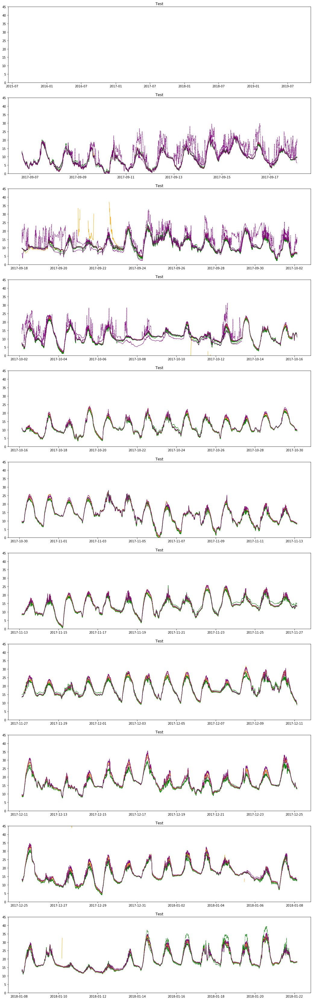

In [8]:
def MakeGraph(DataFrame,ymax,ymin):
    PlotDuration = 2
    Pannels = np.int(ExptDuration/PlotDuration)
    #Create a figure object
    for X in range (0,Pannels):
        if (X == 0):
            StartDate = Data.index.min(axis=0)  #Set start of series at start of data
        else: 
            StartDate = StartDate + timedelta(weeks=PlotDuration)    #increment start date by a week
        StartDateString = StartDate.strftime("%Y-%m-%d")  #Turn this to a string
        EndDate = StartDate + timedelta(weeks=PlotDuration)       #Set start date the specified duration before the end date 
        EndDateString = EndDate.strftime("%Y-%m-%d")           #Turn that into a string
        Position = X+1;
        ax = Fig.add_subplot(Pannels,1,Position)
        GH.AddIndexedPlot(DataFrame.loc[StartDate:EndDate,:],ax,GPs,1)
        plt.title('Test', fontsize=12);
        plt.ylim(ymin,ymax)
        
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SurfaceTemp,45,0)

### Some of the sensors have problems.  Check the sensor body temperature reference to work out why

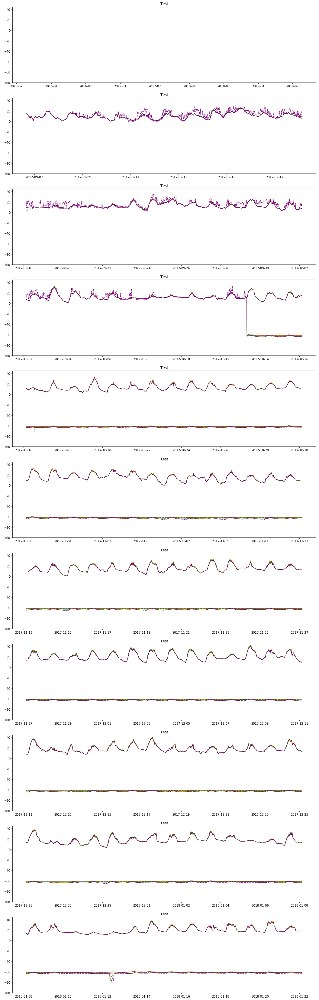

In [14]:
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SensorBodyTemp,45,-100)

## Some sensors were removed for the Baxters trial.  Set these ones to nul

### There are problems with a few sensors which appears to be comming from problems with body temperature referece.  Need to identify this and drop the offending data

In [10]:
MedianBodyTemp = Data.IR_SensorBodyTemp.median(axis=1)
Deviation = pd.DataFrame(index = Data.IR_SensorBodyTemp.index,columns = Data.IR_SensorBodyTemp.columns)
for col in Deviation.columns:
    Deviation.loc[:,col] = Data.IR_SensorBodyTemp.loc[:,col] - MedianBodyTemp

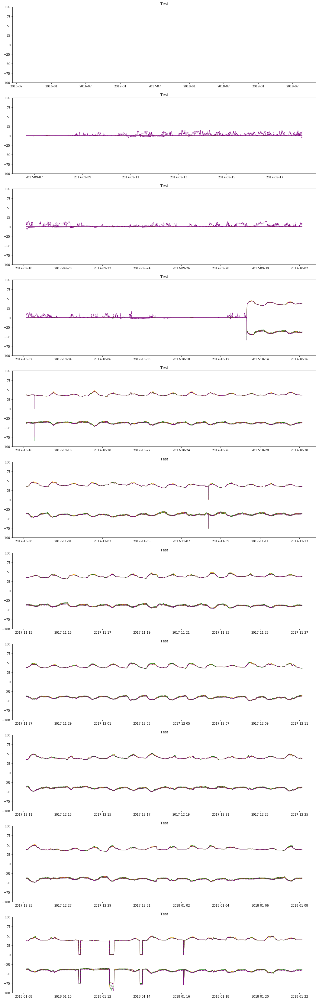

In [12]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Deviation,100,-100)

In [14]:
Data.IR_SurfaceTemp = Data.IR_SurfaceTemp.where(Deviation>-2.0,np.nan)

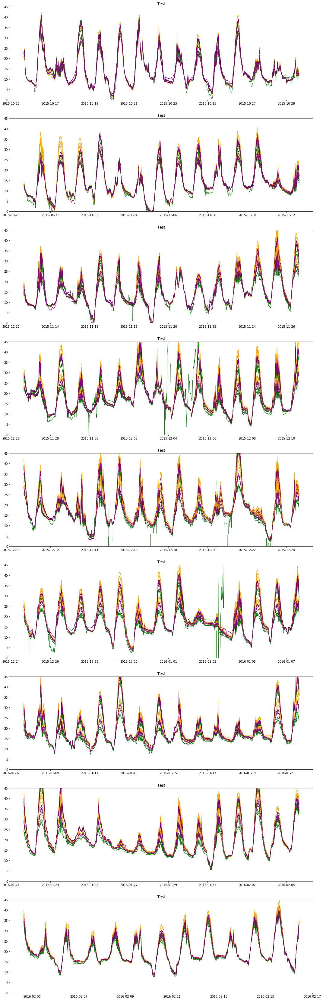

In [15]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SurfaceTemp,45,0)

### There is still a problem with one sensor.  We will have to identify outliers relative to their treatment means.


In [16]:
Treatmedians = Data.IR_SurfaceTemp.groupby(level=['Irrigation','Nitrogen'],axis=1).median()
ST_Deviation = Deviation.copy()
for C in ST_Deviation.columns:
    ST_Deviation.loc[:,C] = Data.IR_SurfaceTemp.loc[:,C] - Treatmedians.loc[:,(C[0],C[1])]

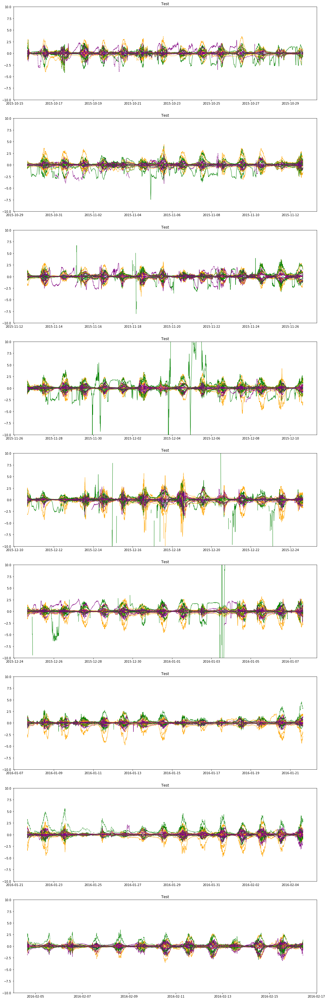

In [17]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(ST_Deviation,10,-10)


## Remove data anomolies relative to treatment means

In [18]:
Data.IR_SurfaceTemp = Data.IR_SurfaceTemp.where((ST_Deviation>-2) & (ST_Deviation<2),np.nan)

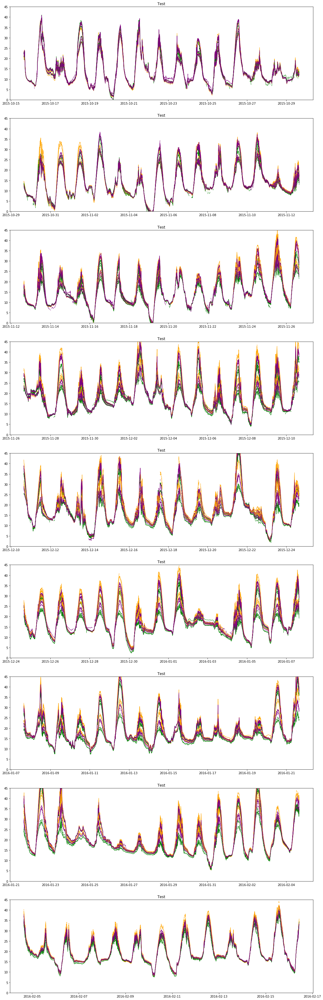

In [19]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SurfaceTemp,45,0)

## Data looks OK to progress with now

# Now lets look at soil temp

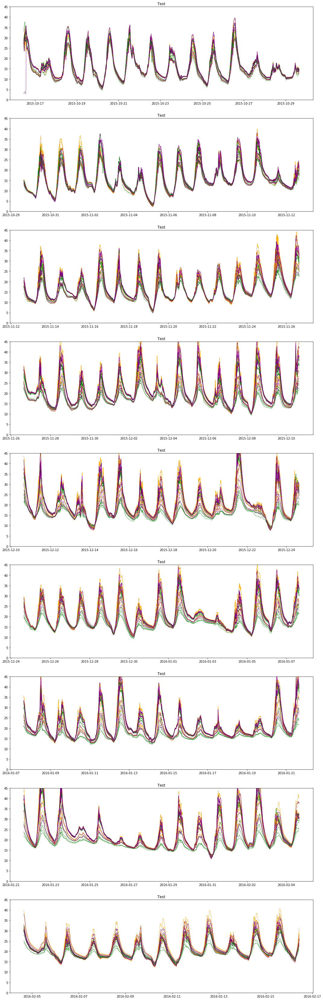

In [20]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.SurfaceSoilTemp,45,0)

## No obvious outlyers, assume needs no cleaning

## Check reflected radiation

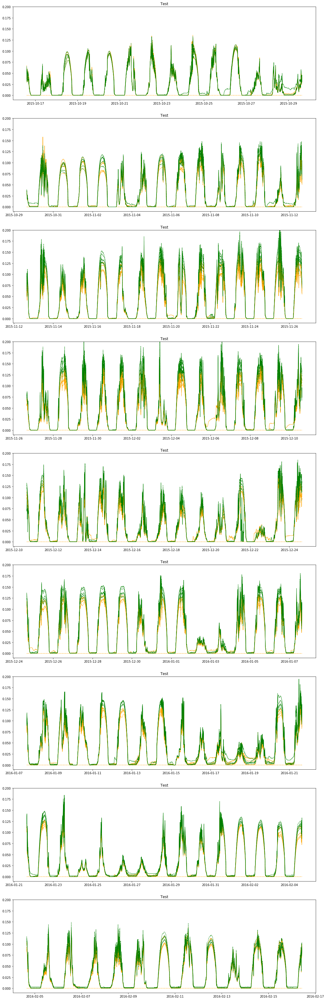

In [21]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.ReflectedRadnMJ,0.2,-0.01)

## One sensor is returning zeros, need to null these values 

In [22]:
Data.loc[:,('ReflectedRadnMJ','Irrigated','0',2,slice(None),slice(None),103)] = np.nan
Data.loc[:,('ReflectedRadnKW','Irrigated','0',2,slice(None),slice(None),103)] = np.nan

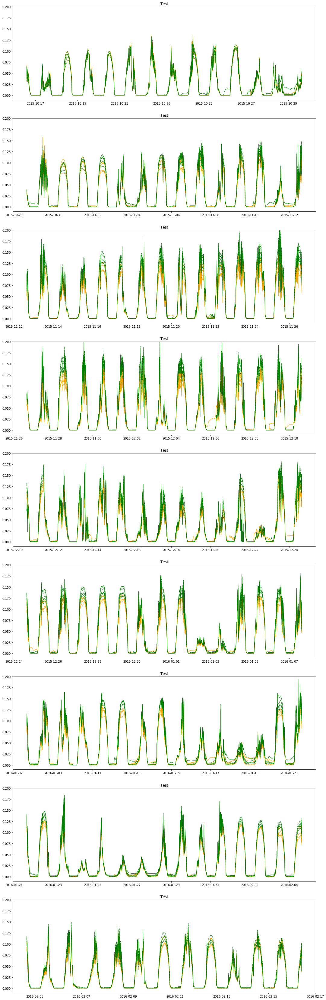

In [23]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.ReflectedRadnMJ,0.2,-0.01)

## Now lets look at above canopy par

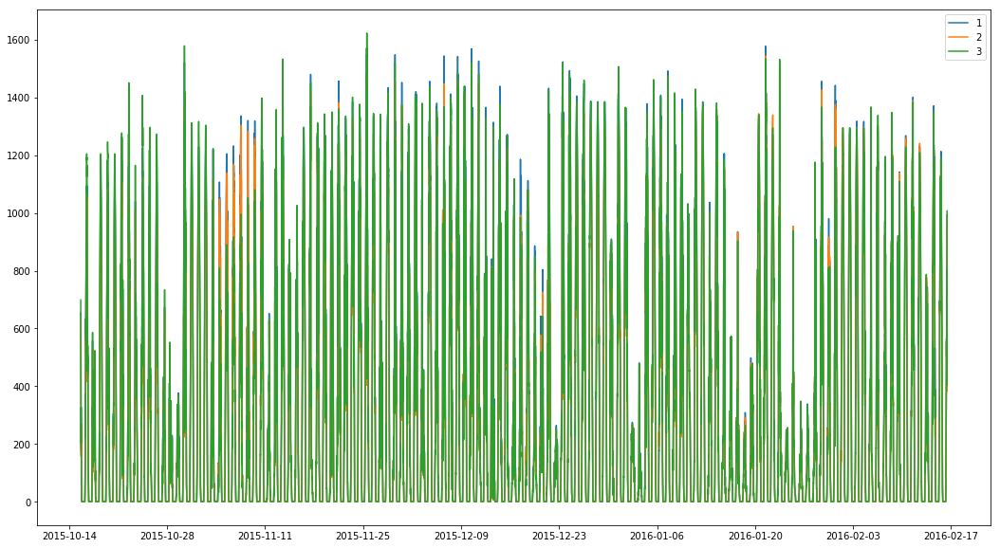

In [24]:
Figure = plt.figure(figsize=(18,10))
plt.plot(Data.AboveCanopyPAR1,label='1')
plt.plot(Data.AboveCanopyPAR2,label='2')
plt.plot(Data.AboveCanopyPAR3,label='3')
plt.legend()

## all three are behaving well so lets take the mean

In [25]:
Data.loc[:,('AboveCanopyPAR','Expt','Expt','Expt','mmolPAR','Ave','Expt','Expt')] = Data.loc[:,['AboveCanopyPAR1','AboveCanopyPAR2','AboveCanopyPAR3']].mean(axis=1)

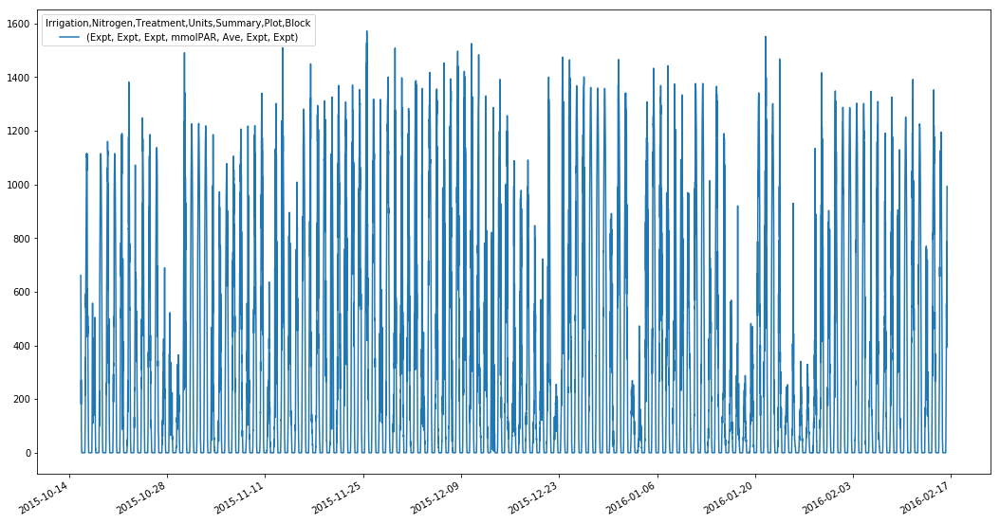

In [26]:
Data.AboveCanopyPAR.plot(figsize = (18,10))

In [27]:
Data.drop(columns = ['AboveCanopyPAR1','AboveCanopyPAR2','AboveCanopyPAR3'], level=0,inplace=True)

# Check Met Data.  Radiation first.

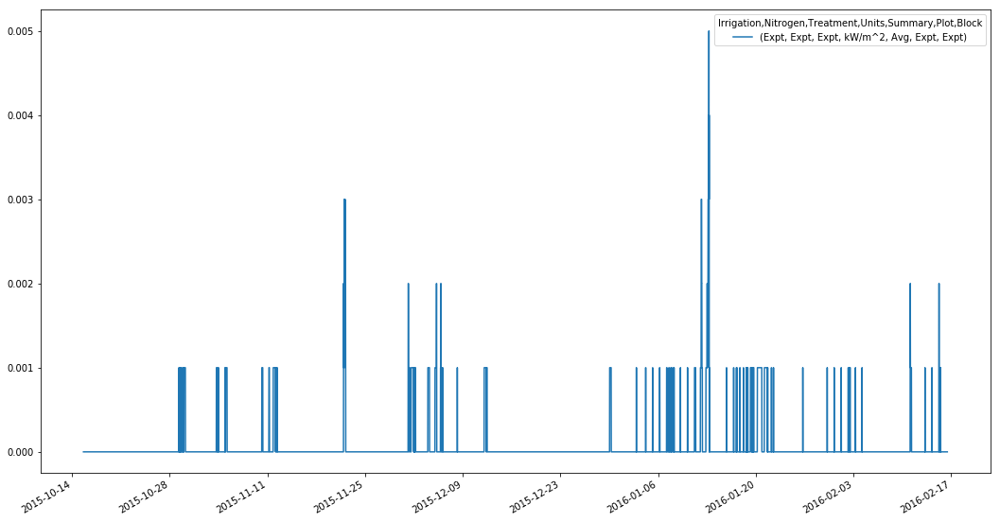

In [28]:
Data.IncomingRadnKW.plot(figsize = (18,10))

## Problem with Radiation sensor, Will Need to patch this with BroadFields data

In [29]:
BroadFieldsMet = pd.read_pickle('..\BroadFieldsMet.pkl')
Data.loc[:,'IncomingRadnMJ'] = BroadFieldsMet.reindex(index = Data.index)['IncomingRadnMJ']
Data.loc[:,'IncomingRadnKW'] = (Data.loc[:,'IncomingRadnMJ'] * 1e6 /600/1000).values 

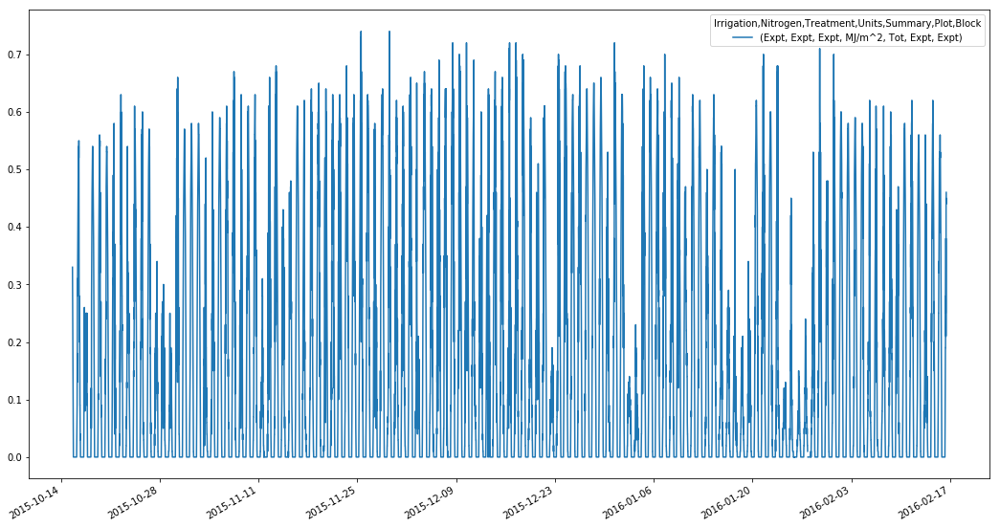

In [30]:
Data.IncomingRadnMJ.plot(figsize = (18,10))

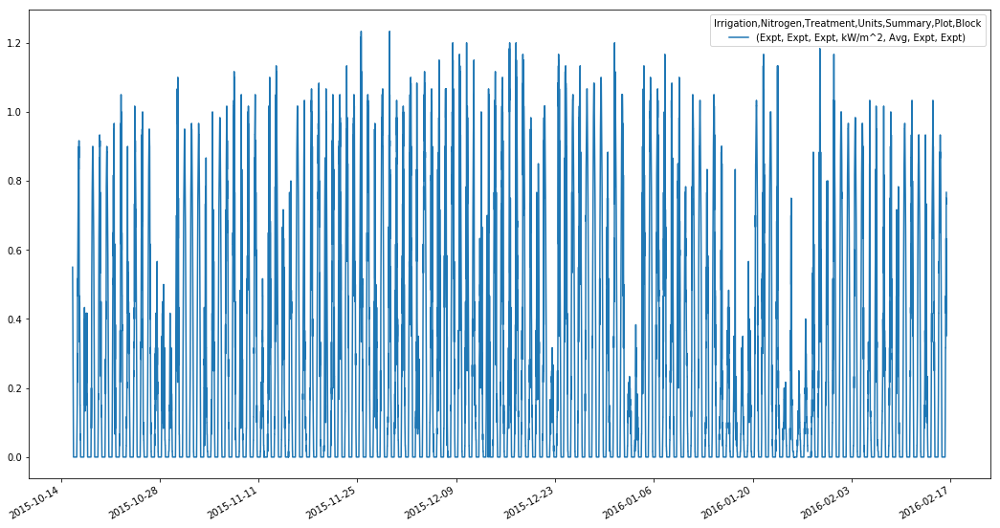

In [31]:
Data.IncomingRadnKW.plot(figsize = (18,10))

## Then Air Temperature

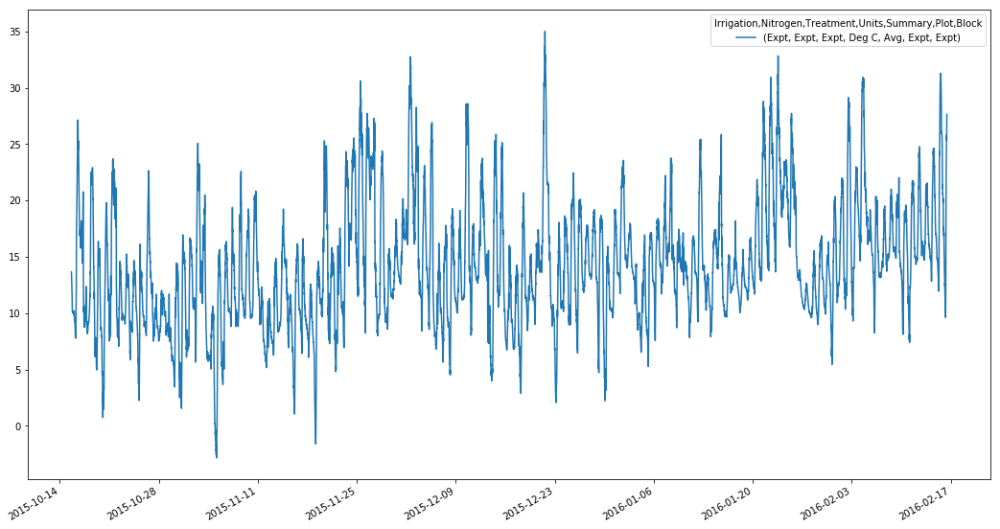

In [32]:
Data.AirTemperature.plot(figsize = (18,10))

## Check humidity

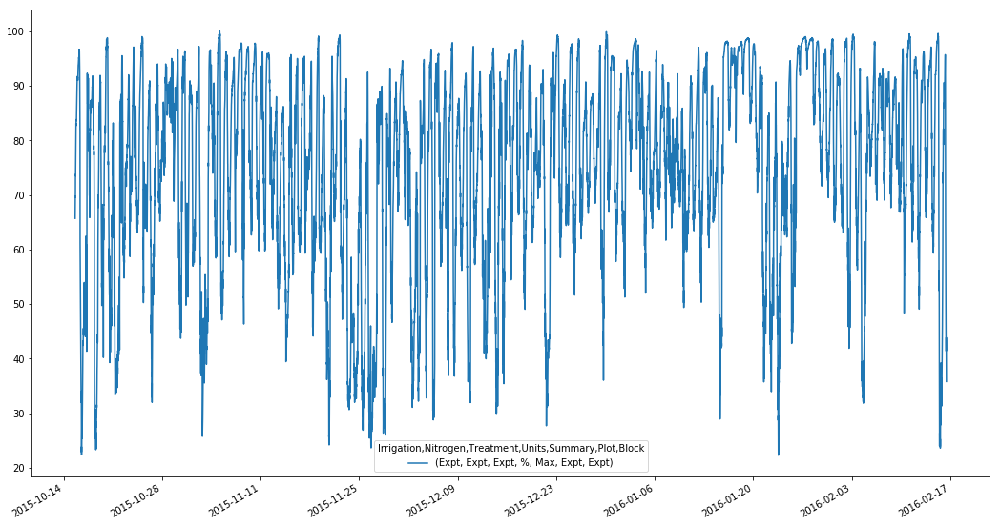

In [33]:
Data.RelativeHumidity.plot(figsize = (18,10))

## Check Wind

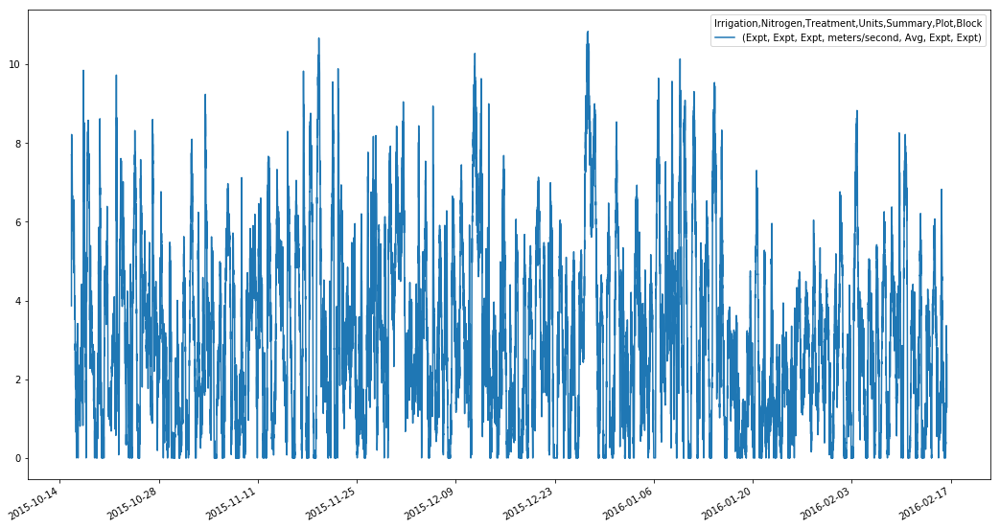

In [34]:
Data.Windspeed.plot(figsize = (18,10))

(0, 0.5)

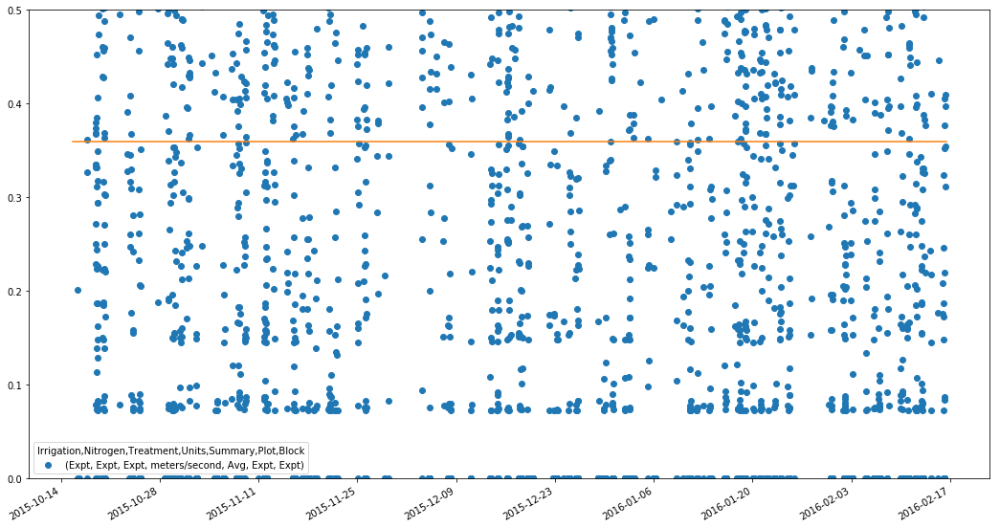

In [35]:
Data.Windspeed.plot(figsize=(18,10),style='o')
plt.plot([Data.index.min(),Data.index.max()],[0.36,0.36])
plt.ylim(0,0.5)

### For some reason data logger not zeroing windspeeds <0.36m/x so we need to enforce this

In [36]:
Data.Windspeed = Data.Windspeed.where(Data.Windspeed>0.36,0.0)

(0, 0.5)

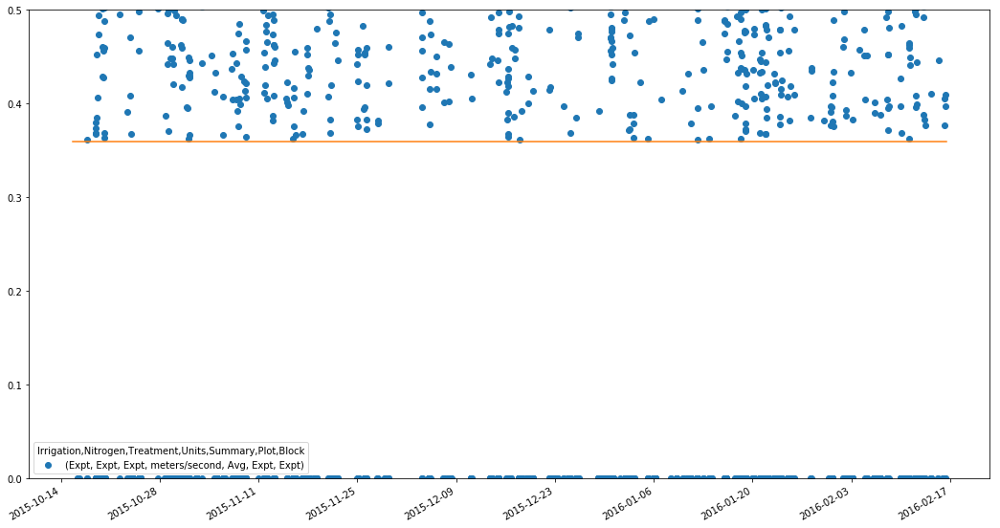

In [37]:
Data.Windspeed.plot(figsize=(18,10),style='o')
plt.plot([Data.index.min(),Data.index.max()],[0.36,0.36])
plt.ylim(0,0.5)

## Check Leaf Wettness

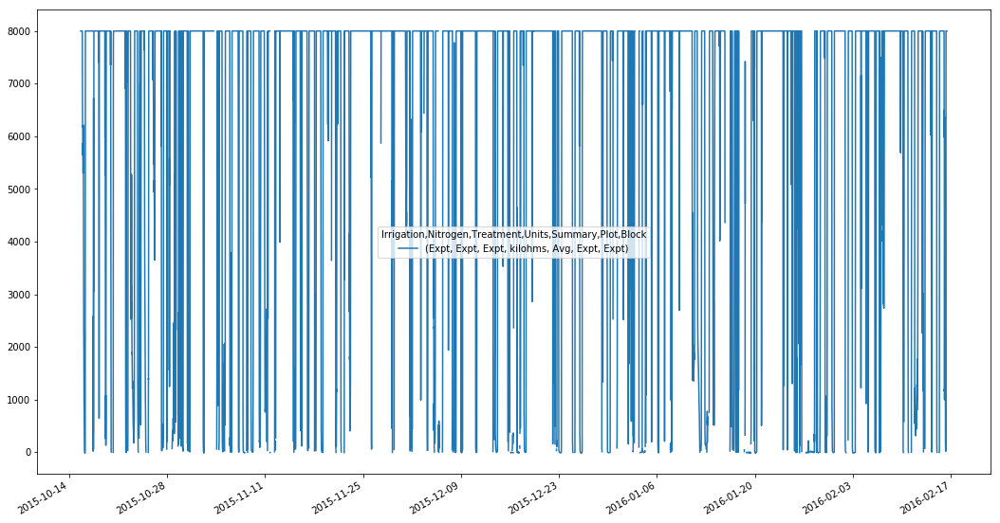

In [38]:
Data.Leafwetness.plot(figsize = (18,10))

# Now we have a clean data set lets pickle it

In [39]:
Data.to_pickle('.\DataFrames\TempAndRadnCleaned.pkl')

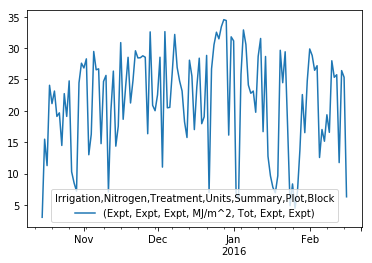

In [43]:
Data.IncomingRadnMJ.resample('d').sum().plot()